In [1]:
!pip install ultralytics opencv-python tqdm matplotlib -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.5 MB/s eta 0:00:00


In [2]:
import os
import shutil
import yaml
import time
import random
from glob import glob
from tqdm import tqdm

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/dataset/Kvasir.zip
!unzip -q -o 'Kvasir.zip'

--2025-12-17 05:31:00--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/dataset/Kvasir.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/dataset/Kvasir.zip [following]
--2025-12-17 05:31:01--  https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/dataset/Kvasir.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 77444639 (74M) [application/zip]
Saving to: ‘Kvasir.zip’

Kvasir.zip          100%[===================>]  73.86M  21.7MB/s    in 3.4s    

2025-12-17 05:31:04 (21.6 MB/s) - ‘Kvasir.zip’ saved [77444

In [4]:
base_root = "./"
dataset_root = os.path.join(base_root, "Kvasir-SEG", "Kvasir-SEG")

img_dir = os.path.join(dataset_root, "images")
mask_dir = os.path.join(dataset_root, "masks")

train_txt = os.path.join(base_root, "train.txt")
val_txt = os.path.join(base_root, "val.txt")

os.makedirs("dataset/images/train", exist_ok=True)
os.makedirs("dataset/images/val", exist_ok=True)
os.makedirs("dataset/labels/train", exist_ok=True)
os.makedirs("dataset/labels/val", exist_ok=True)

In [5]:
# Convert mask -> YOLO segmentation labels
def mask_to_yolo(mask_path, save_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        return
    mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)[1]
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    h, w = mask.shape
    lines = []
    for cnt in contours:
        if len(cnt) < 3:
            continue
        cnt = cnt.reshape(-1, 2)
        norm = []
        for x, y in cnt:
            norm.append(f"{x/w:.6f} {y/h:.6f}")
        line = f"0 " + " ".join(norm)
        lines.append(line)
    with open(save_path, "w") as f:
        f.write("\n".join(lines))

In [6]:
def prepare_split(txt_file, split):
    with open(txt_file, "r") as f:
        ids = [line.strip() for line in f.readlines() if line.strip()]
    for img_id in tqdm(ids, desc=f"Processing {split}"):

        found_img = None
        for ext in [".jpg", ".png", ".jpeg", ".bmp"]:
            candidate = os.path.join(img_dir, img_id + ext)
            if os.path.exists(candidate):
                found_img = candidate
                break

        if found_img is None:
            print(f"error: {img_id}")
            continue

        found_mask = None
        for ext in [".jpg", ".png", ".jpeg", ".bmp"]:
            candidate_mask = os.path.join(mask_dir, img_id + ext)
            if os.path.exists(candidate_mask):
                found_mask = candidate_mask
                break

        if found_mask is None:
            continue

        img_name = os.path.basename(found_img)
        shutil.copy(found_img, f"dataset/images/{split}/{img_name}")
        yolo_label_path = f"dataset/labels/{split}/{img_id}.txt"
        mask_to_yolo(found_mask, yolo_label_path)

prepare_split(train_txt, "train")
prepare_split(val_txt, "val")

Processing val: 100%|██████████| 100/100 [00:00<00:00, 503.92it/s]


In [7]:
data_yaml = {
    "train": os.path.abspath("dataset/images/train"),
    "val": os.path.abspath("dataset/images/val"),
    "nc": 1,
    "names": ["polyp"]
}
with open("kvasir.yaml", "w") as f:
    yaml.dump(data_yaml, f, default_flow_style=False)
print(open("kvasir.yaml").read())

names:
- polyp
nc: 1
train: /content/dataset/images/train
val: /content/dataset/images/val



In [8]:
model = YOLO("/content/model_- 17 december 2025 11_51.pt")


0: 320x320 1 polyp, 223.5ms
1: 320x320 1 polyp, 223.5ms
2: 320x320 1 polyp, 223.5ms
3: 320x320 1 polyp, 223.5ms
4: 320x320 1 polyp, 223.5ms
Speed: 9.5ms preprocess, 223.5ms inference, 13.6ms postprocess per image at shape (1, 3, 320, 320)


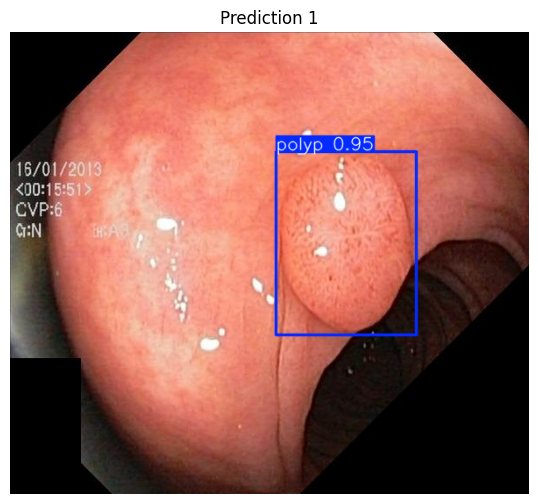

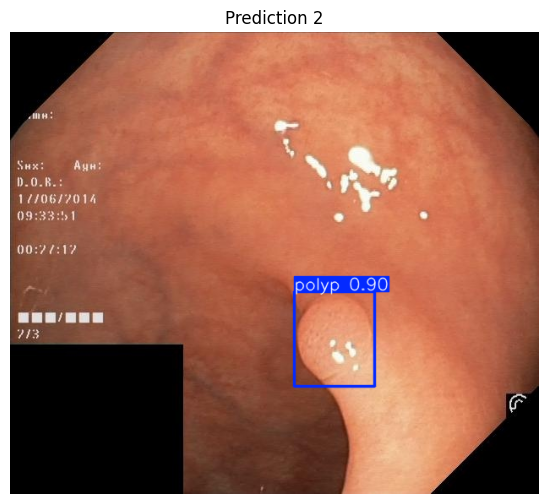

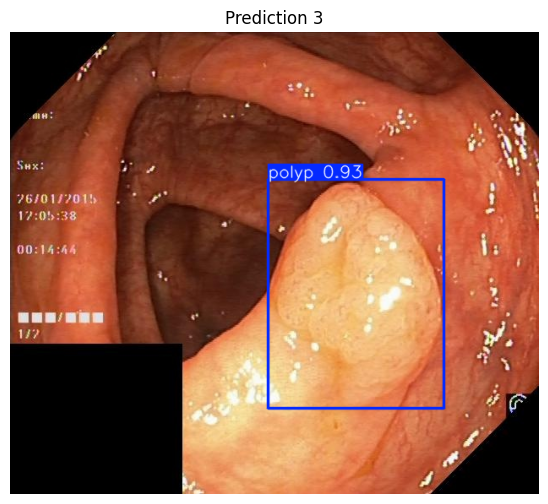

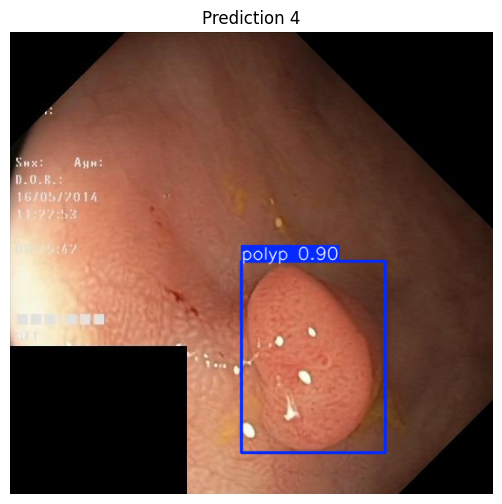

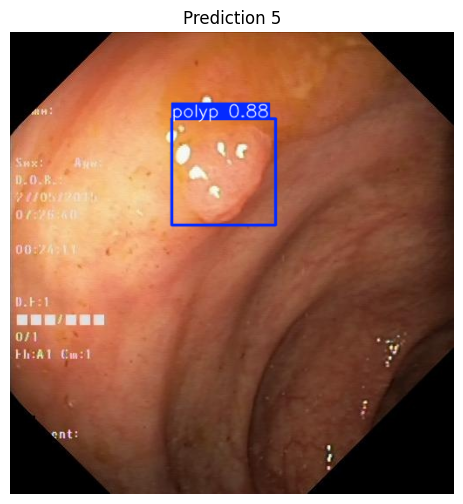

In [9]:
val_imgs = random.sample(glob("dataset/images/val/*.jpg") + glob("dataset/images/val/*.png"), 5)
results = model.predict(val_imgs, conf=0.3)

for i, r in enumerate(results):
    img = r.plot()[:, :, ::-1]
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction {i+1}")
    plt.show()

In [10]:
val_imgs = glob("dataset/images/val/*.jpg") + glob("dataset/images/val/*.png")
print(f"Testing {len(val_imgs)} validation images...")

ious, dices, times = [], [], []

for img_path in tqdm(val_imgs, desc="Evaluating YOLOv8"):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Cannot read image: {img_path}")
        continue

    # Inference
    start = time.time()
    results = model.predict(img, conf=0.3, verbose=False)
    times.append(time.time() - start)

    if results[0].masks is None or len(results[0].masks.data) == 0:
        continue

    pred_mask = results[0].masks.data[0].cpu().numpy()
    pred_mask = cv2.resize(pred_mask, (img.shape[1], img.shape[0]))

    # mask ground-truth
    mask_path = None
    img_name = os.path.basename(img_path)
    for ext in [".png", ".jpg", ".jpeg", ".bmp"]:
        candidate = os.path.join(mask_dir, os.path.splitext(img_name)[0] + ext)
        if os.path.exists(candidate):
            mask_path = candidate
            break
    if mask_path is None:
        print(f"Cannot find mask for: {img_name}")
        continue

    mask_gt = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask_gt is None:
        print(f"Cannot read mask: {mask_path}")
        continue
    mask_gt = (mask_gt > 127).astype(np.float32)

    i, d = calc_iou_dice(pred_mask, mask_gt)
    ious.append(i)
    dices.append(d)

print(f"\n YOLOv8 Performance:")
print(f"• Mean IoU:  {np.mean(ious):.4f}")
print(f"• Mean Dice: {np.mean(dices):.4f}")
print(f"• Avg inference time: {np.mean(times)*1000:.2f} ms/img")


Testing 100 validation images...


Evaluating YOLOv8: 100%|██████████| 100/100 [00:07<00:00, 12.58it/s]


 YOLOv8 Performance:
• Mean IoU:  nan
• Mean Dice: nan
• Avg inference time: 75.57 ms/img



/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [11]:
def bbox_iou(box1, box2):
    """
    box: [x1, y1, x2, y2]
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)

    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union = area1 + area2 - inter
    return inter / union if union > 0 else 0

In [14]:
!unzip -q -o 'bbox2.zip'

In [15]:
val_imgs = glob("dataset/images/val/*.jpg") + glob("dataset/images/val/*.png")
print(f"Testing {len(val_imgs)} validation images...")

ious, times = [], []

for img_path in tqdm(val_imgs, desc="Evaluating YOLOv8 Detection"):
    img = cv2.imread(img_path)
    if img is None:
        continue

    # Inference
    start = time.time()
    results = model.predict(img, conf=0.3, verbose=False)
    times.append(time.time() - start)

    # No detection
    if results[0].boxes is None or len(results[0].boxes) == 0:
        continue

    # ใช้ bbox ที่ confidence สูงสุด
    pred_box = results[0].boxes.xyxy[0].cpu().numpy()

    # -------------------------
    # Load GT bounding box
    # -------------------------
    label_path = os.path.join(
        "bbox2",
        os.path.splitext(os.path.basename(img_path))[0] + ".txt"
    )
    if not os.path.exists(label_path):
        continue

    with open(label_path) as f:
        gt = f.readline().strip().split()

    # YOLO format → xyxy
    cls, xc, yc, w, h = map(float, gt)

    H, W = img.shape[:2]
    gt_box = [
        (xc - w / 2) * W,
        (yc - h / 2) * H,
        (xc + w / 2) * W,
        (yc + h / 2) * H,
    ]

    iou = bbox_iou(pred_box, gt_box)
    ious.append(iou)

print("\n YOLOv8 Detection Performance:")
print(f"• Mean IoU: {np.mean(ious):.4f}")
print(f"• Avg inference time: {np.mean(times)*1000:.2f} ms/img")

Testing 100 validation images...


Evaluating YOLOv8 Detection: 100%|██████████| 100/100 [00:07<00:00, 14.06it/s]


 YOLOv8 Detection Performance:
• Mean IoU: 0.8405
• Avg inference time: 67.53 ms/img


In [16]:
cap = cv2.VideoCapture("video.mp4")

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter(
    "output.mp4",
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w, h)
)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame, conf=0.3)[0]

    annotated = results.plot()  # วาด bbox
    out.write(annotated)

cap.release()
out.release()

In [17]:
!ffmpeg -i /content/output.mp4 -vcodec libx264 -acodec aac /content/output_fixed.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [19]:
from IPython.display import Video

Video("video.mp4", embed=True)

In [20]:
Video("output_fixed.mp4", embed=True)